In [8]:
# Parameters
notebook_fname = "NN_full_RepeatedKFold_v3_BO_test"


In [9]:
import sys
sys.path.append("../CCA_representation_ML/")

In [10]:
# basic machine learning libaries
import os

# Tensorflow
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras import layers
from keras.layers import Dense, Concatenate, Dropout, BatchNormalization
from keras.utils.vis_utils import plot_model

# Data processing and plotting
import numpy as np
from numpy import asarray
import pandas as pd
import scipy as sp
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.pyplot import figure
from tabulate import tabulate

# Bayesian Optimization
import GPyOpt

# Parellisation
from multiprocessing import Pool
from joblib import Parallel, delayed
import concurrent.futures

# Miscellaneous
from importlib import reload
import pickle
import time
# import warnings
# warnings.filterwarnings("ignore")
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # or any {'0', '1', '2'}

print(f'cpu_count: {os.cpu_count()}')

# Data Path
data_path = '../CCA_representation_ML/01_Dataset_Cleaned/'
if os.path.isfile(data_path+'LiteratureDataset_Corrosion_YW_v3_processed.xlsx'):
    print(f"Folder '{data_path}' found.")
else:
    print(f"Warning: File '{data_path}' not found!")

# Setting up multiple path for parallel Bayesian Optimization
num_str = notebook_fname.split("_")[-1]  # get the last string after "_"

try:
    bo_ens_num = int(num_str)
    print(f"bo_ens_num: {bo_ens_num}")
except ValueError:
    # if the string can't be converted to an integer, keep it as a string
    bo_ens_num = int(123)
    print(f"book master - bo_ens_num: {bo_ens_num}")

model_path = '../CCA_representation_ML/04_Model_Saved/'
model_path_bo = f'{model_path}{notebook_fname}/'

if not os.path.exists(model_path_bo):
    os.makedirs(model_path_bo)
    print(f"Folder '{model_path_bo}' created.")
else:
    print(f"Folder '{model_path_bo}' already exists.")

# Cleaning up previous tensorflow sessions
tf.keras.backend.clear_session()


cpu_count: 40
Folder '../CCA_representation_ML/01_Dataset_Cleaned/' found.
book master - bo_ens_num: 123
Folder '../CCA_representation_ML/04_Model_Saved/NN_full_RepeatedKFold_v3_BO_test/' already exists.


## functionality control


In [11]:
# Use GPU or not
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
print('not using GPU')


not using GPU


## Evaluate the training results

- Show the model.h5 files in this directory
- Load scalers


In [13]:
import pickle
from utils.postprocessing_evalutation import display_saved_models

display_saved_models(model_path_bo)

# Load the scalers dictionary from a file using pickle
with open(data_path + 'scalers.pkl', 'rb') as f:
    scalers = pickle.load(f)
    print("")
print(scalers)


NNH_model                      NNC_model
-----------------------------  -----------------------------
NNH_model_RepeatedKFold_1.h5   NNC_model_RepeatedKFold_1.h5
NNH_model_RepeatedKFold_2.h5   NNC_model_RepeatedKFold_2.h5
NNH_model_RepeatedKFold_3.h5   NNC_model_RepeatedKFold_3.h5
NNH_model_RepeatedKFold_4.h5   NNC_model_RepeatedKFold_4.h5
NNH_model_RepeatedKFold_5.h5   NNC_model_RepeatedKFold_5.h5
NNH_model_RepeatedKFold_6.h5   NNC_model_RepeatedKFold_6.h5
NNH_model_RepeatedKFold_7.h5   NNC_model_RepeatedKFold_7.h5
NNH_model_RepeatedKFold_8.h5   NNC_model_RepeatedKFold_8.h5
NNH_model_RepeatedKFold_9.h5   NNC_model_RepeatedKFold_9.h5
NNH_model_RepeatedKFold_10.h5  NNC_model_RepeatedKFold_10.h5
NNH_model_RepeatedKFold_11.h5  NNC_model_RepeatedKFold_11.h5
NNH_model_RepeatedKFold_12.h5  NNC_model_RepeatedKFold_12.h5

{'compo': MinMaxScaler(), 'H_specific_testing': MinMaxScaler(), 'C_specific_testing': MinMaxScaler(), 'specific_features': MinMaxScaler(), 'H_output': MinMaxScaler(), 'C_outp

## Predict based on new data inputs


### coordinates for PVD alloy representation


In [6]:
# load the wafer-coordinates
df_PVD_x_y = pd.read_excel(data_path + 'PVD_x_y.xlsx')
coord_x = df_PVD_x_y["x"].to_numpy(dtype=float)
coord_y = df_PVD_x_y["y"].to_numpy(dtype=float)
index_PVD_x_y = df_PVD_x_y.index.values+1


### Make prediction for new alloys

- NiCrCoVFe_KW99
- NiCrMoTiFe_KW131


Processing:   0%|          | 0/2 [00:00<?, ?it/s]

['Ni', 'Cr', 'Co', 'V', 'Fe']
NiCrCoVFe_KW99


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosi

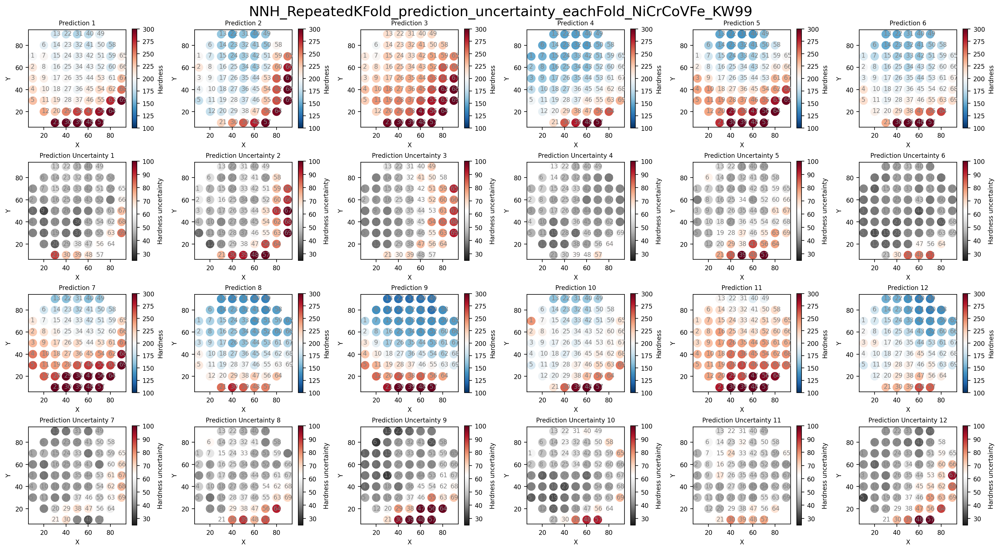

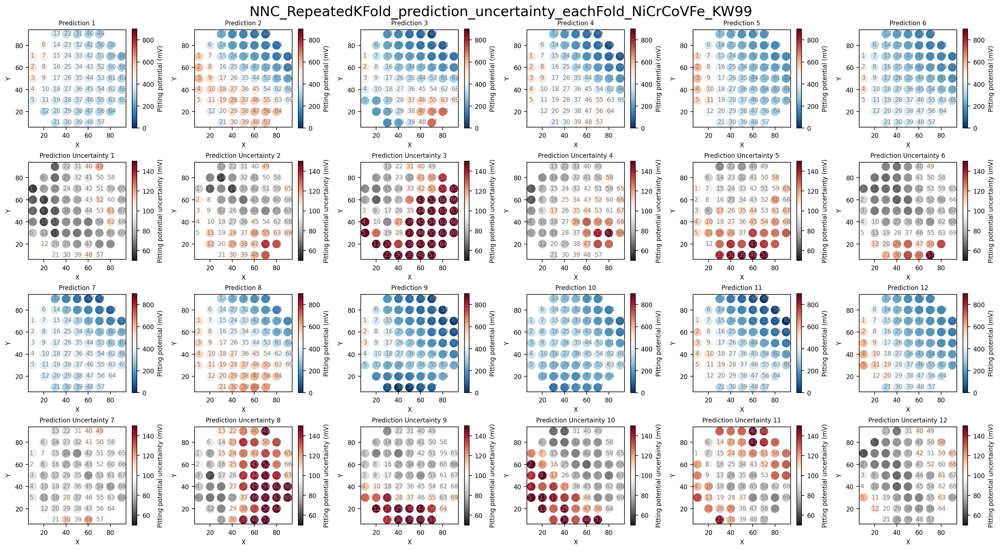

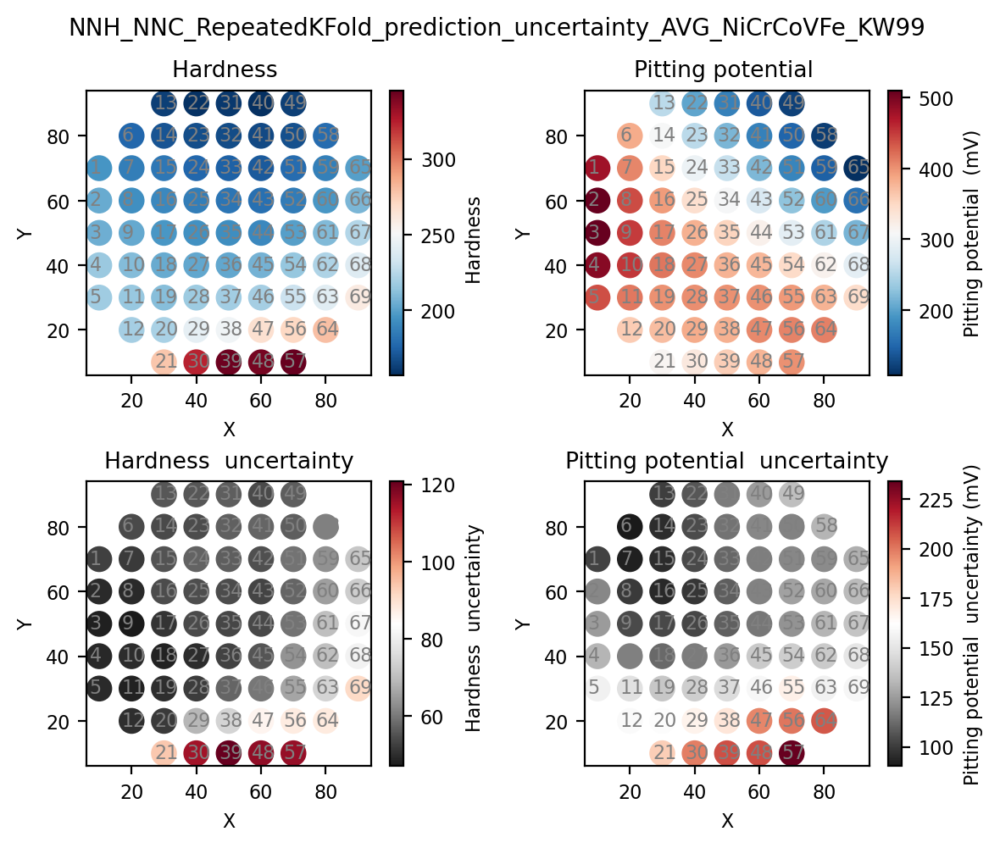

Processing:  50%|█████     | 1/2 [01:05<01:05, 65.06s/it]

['Ni', 'Cr', 'Mo', 'Ti', 'Fe']
NiCrMoTiFe_KW131


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosi

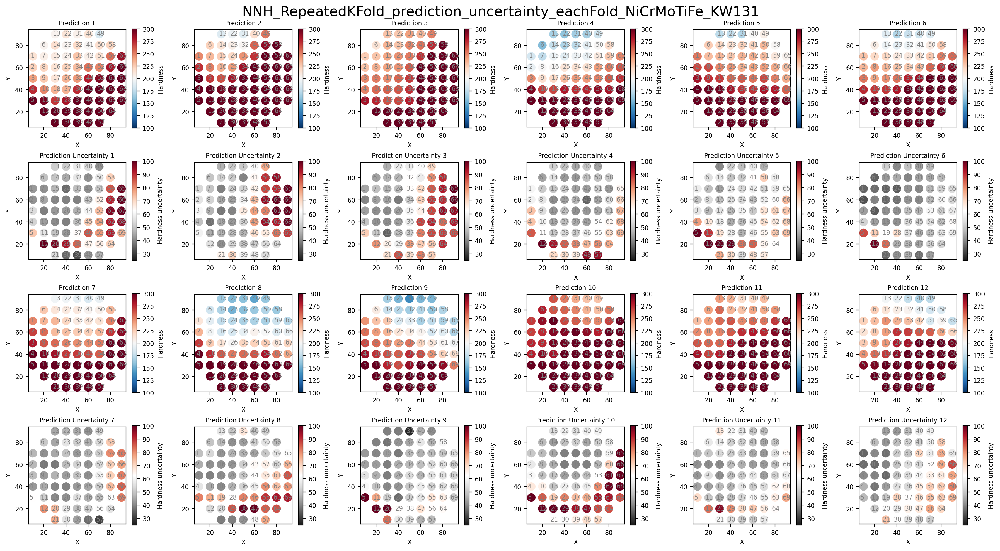

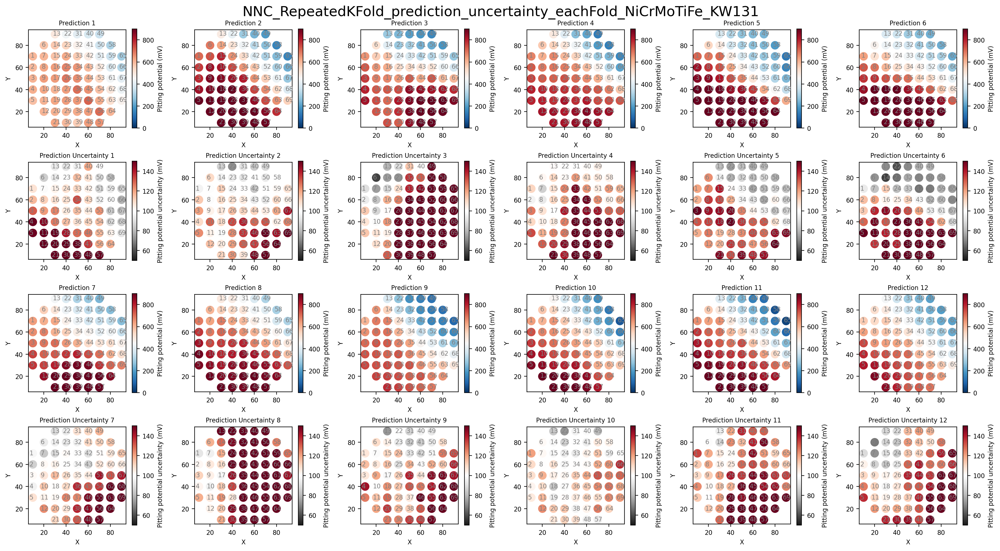

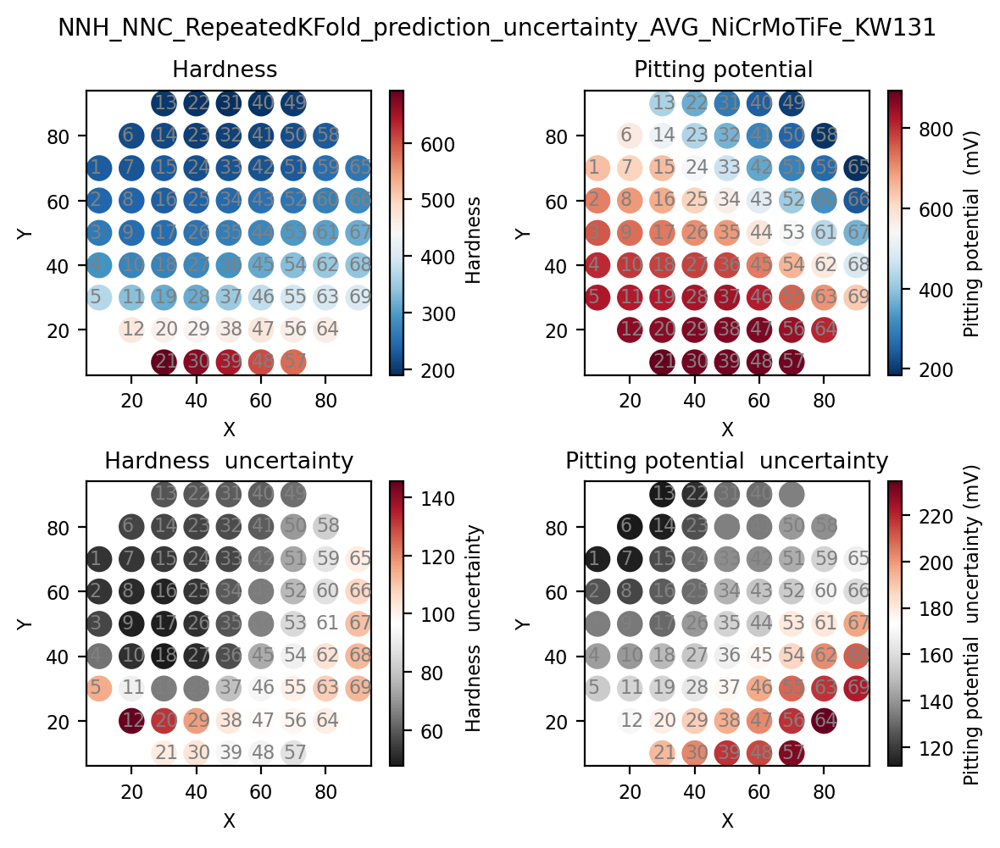

Processing: 100%|██████████| 2/2 [02:07<00:00, 63.56s/it]


In [14]:
from utils.postprocessing_prediction import read_new_data_feature_calc, predict_bootstrap_NNH_NNC, plot_prediction_uncertainty, plot_prediction_uncertainty_AVG
from tqdm import tqdm

compo_A_B_C_D_E_list = [['Ni', 'Cr', 'Co', 'V', 'Fe'],
                        ['Ni', 'Cr', 'Mo', 'Ti', 'Fe']]
compo_A_B_C_D_E_fname_list = ['NiCrCoVFe_KW99',
                              'NiCrMoTiFe_KW131']

for compo_A_B_C_D_E, compo_A_B_C_D_E_fname in tqdm(zip(compo_A_B_C_D_E_list, compo_A_B_C_D_E_fname_list), desc='Processing', total=len(compo_A_B_C_D_E_list)):

    print(compo_A_B_C_D_E)
    print(compo_A_B_C_D_E_fname)

    vars_ele = compo_A_B_C_D_E
    KW_name = compo_A_B_C_D_E_fname
    file_name_input = f'{data_path}MultiTaskModel_{KW_name}_wt_pct.xlsx'
    df_new_wt = pd.read_excel(file_name_input)

    compo_new, HC_specific_features, C_specific_testing = read_new_data_feature_calc(df_new_wt, vars_ele,
                                                                                     specific_features_sel_column=['delta_a', 'Tm', 'sigma_Tm',
                                                                                                                   'Hmix', 'sigma_Hmix', 'sigma_elec_nega', 'VEC', 'sigma_VEC'],
                                                                                     C_testing=np.array([25, 1, 7, 0.333]))

    NNH_model_name = 'NNH_model_RepeatedKFold_{}.h5'
    NNC_model_name = 'NNC_model_RepeatedKFold_{}.h5'
    k_folds, n_CVrepeats, mc_repeat = 6, 2, 100

    (H1_new_pred_stack, H1_new_pred_mean, H1_new_pred_std,
     C2_new_pred_stack, C2_new_pred_mean, C2_new_pred_std) = predict_bootstrap_NNH_NNC(
        model_path_bo, NNH_model_name, NNC_model_name,
        compo_new, HC_specific_features, C_specific_testing,
        scalers, k_folds, n_CVrepeats, mc_repeat)

    # Concatenate and compute mean and std + save to excel
    H1_new_pred_KFold_mean = np.mean(np.concatenate(
        H1_new_pred_stack, axis=0), axis=0).reshape(-1)
    H1_new_pred_KFold_std = np.std(np.concatenate(
        H1_new_pred_stack, axis=0), axis=0).reshape(-1)
    C2_new_pred_KFold_mean = np.mean(np.concatenate(
        C2_new_pred_stack, axis=0), axis=0).reshape(-1)
    C2_new_pred_KFold_std = np.std(np.concatenate(
        C2_new_pred_stack, axis=0), axis=0).reshape(-1)

    df_new_wt['H1_new_pred_KFold_mean'] = H1_new_pred_KFold_mean
    df_new_wt['H1_new_pred_KFold_std'] = H1_new_pred_KFold_std
    df_new_wt['C2_new_pred_KFold_mean'] = C2_new_pred_KFold_mean
    df_new_wt['C2_new_pred_KFold_std'] = C2_new_pred_KFold_std

    file_name_output = f'{model_path_bo}MultiTaskModel_{KW_name}_wt_pct_ML.xlsx'
    df_new_wt.to_excel(file_name_output)

    # NNH predictions
    plot_prediction_uncertainty(model_path_bo, coord_x, coord_y, index_PVD_x_y, H1_new_pred_mean, H1_new_pred_std,
                                pred_label='Hardness', unc_label='Hardness uncertainty',
                                title='NNH_RepeatedKFold_prediction_uncertainty_eachFold_' + KW_name,
                                vmin1=100, vmax1=300,
                                vmin2=25, vmax2=100)

    # NNC predictions
    plot_prediction_uncertainty(model_path_bo, coord_x, coord_y, index_PVD_x_y, C2_new_pred_mean, C2_new_pred_std,
                                pred_label='Pitting potential (mV)', unc_label='Pitting potential uncertainty (mV)',
                                title='NNC_RepeatedKFold_prediction_uncertainty_eachFold_' + KW_name,
                                vmin1=0, vmax1=900,
                                vmin2=50, vmax2=150)

    # NNH_NNC_AVG predictions
    plot_prediction_uncertainty_AVG(model_path_bo, coord_x, coord_y, index_PVD_x_y, H1_new_pred_stack, C2_new_pred_stack,
                                    title='NNH_NNC_RepeatedKFold_prediction_uncertainty_AVG_' + KW_name)
